# Demo

In [1]:
import os
import numpy as np
import torch

from ddpm.ddpm import DDPM
from ddpm.models import BasicDiscreteTimeModel
from ddpm.main import train, animate


# Set device
#if torch.cuda.is_available():
#    device = torch.device("cuda:0")
#    torch.cuda.empty_cache()
#    print("Using NVIDIA GPU")
#elif torch.backends.mps.is_available():
#    device = torch.device("mps")
#    print("Using Apple GPU")
#else:
#    device = torch.device("cpu")
#    print("Using CPU")
device = torch.device("cpu")
print("Using CPU")

# Set seeds
seed = 42
def set_seed(seed: int = seed) -> None:
    np.random.seed(seed)
    os.environ["PYTHONHASHSEED"] = str(seed)
    torch.manual_seed(seed)
    if torch.cuda.is_available(): # Set cuda seeds
        torch.cuda.manual_seed(seed)
        torch.backends.cudnn.deterministic = True
        torch.backends.cudnn.benchmark = False
    print(f"Random seed set as {seed}")

set_seed()

Using CPU
Random seed set as 42
Using CPU
Random seed set as 42


Creating model ...
Model created!
Training ...


Iter: 3190. Average Loss: 0.6845: 100%|██████████| 3200/3200 [00:21<00:00, 150.67it/s]


Training concluded!


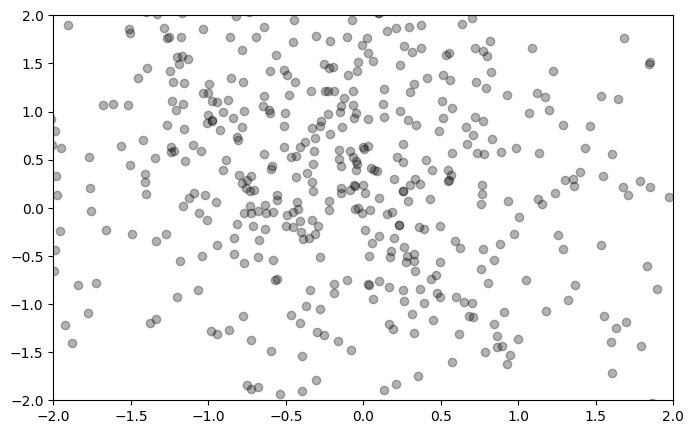

In [2]:
d_model = 128
n_layers = 2
batch_size = 128
n_epochs = 400
sample_size = 512
steps_between_sampling = 20
seed = 42
n_steps = 100


print("Creating model ...")
model = BasicDiscreteTimeModel(d_model=d_model, n_layers=n_layers).to(device)
ddpm = DDPM(n_steps=n_steps).to(device)
print("Model created!")

print("Training ...")
result = train(
    model=model,
    ddpm=ddpm,
    batch_size=batch_size,
    n_epochs=n_epochs,
    sample_size=sample_size,
    steps_between_sampling=steps_between_sampling,
    device=device
)
print("Training concluded!")

# Move tensor to cpu() if it is allocated in gpu memory
result.samples[0] = result.samples[0].cpu() if result.samples[0].get_device() != -1 else result.samples[0] 

anim = animate(result.samples, save=False)

In [3]:
from IPython.display import HTML
HTML(anim.to_jshtml())